# 📚 Image Segmentation - Lecture 9
## A Complete Guide from Basic to Advanced Methods

This notebook implements classical image segmentation techniques covered in DIP Lecture 09.

### Table of Contents:
1. **Setup & Utilities**
2. **Thresholding Techniques**
   - Global Thresholding (Manual & Otsu's Method)
   - Adaptive Thresholding
   - Multi-Level Thresholding
3. **Edge-Based Segmentation**
   - Gradient Operators
   - Canny Edge Detection
   - Edge Linking & Contour Extraction
4. **Region-Based Segmentation**
   - Region Growing
   - Region Split & Merge
5. **Clustering-Based Methods**
   - K-Means Segmentation
   - Mean-Shift Clustering
6. **Graph-Based Segmentation**
   - Normalized Cuts
7. **Advanced Classical Methods**
   - Watershed Algorithm
   - Active Contours (Snakes)
   - GrabCut
   - SLIC Superpixels
8. **Evaluation Metrics**


## 1. SETUP & IMPORTS

In [64]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy import ndimage
from skimage import segmentation, color, filters, feature, morphology
from skimage.segmentation import watershed, slic, felzenszwalb
from skimage.measure import label, regionprops
from sklearn.cluster import KMeans, MeanShift
import warnings
warnings.filterwarnings('ignore')

# Set matplotlib style for better visualizations
plt.style.use('seaborn-v0_8-darkgrid')

### UTILITY FUNCTIONS

In [65]:
def load_image(path, grayscale=False):
    """Load image from path"""
    if grayscale:
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    else:
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def show_images(images, titles, figsize=(15, 5), cmap='gray'):
    """Display multiple images in a row"""
    n = len(images)
    fig, axes = plt.subplots(1, n, figsize=figsize)
    if n == 1:
        axes = [axes]
    
    for ax, img, title in zip(axes, images, titles):
        if len(img.shape) == 2:
            ax.imshow(img, cmap=cmap)
        else:
            ax.imshow(img)
        ax.set_title(title, fontsize=12, fontweight='bold')
        ax.axis('off')
    plt.tight_layout()
    plt.show()



## 2. THRESHOLDING TECHNIQUES

## Part 1: Thresholding Techniques

### What is Thresholding?
Thresholding is the simplest segmentation method that separates objects from 
background based on intensity values.

**Formula:**

$$ g(x,y) = 1\; if\; f(x,y) ≥ T $$

$$ 0\;   if\; f(x,y) < T $$


Where:
- f(x,y) = Input pixel intensity
- T = Threshold value
- g(x,y) = Output (1=object, 0=background)

### 2.1 Global Thresholding

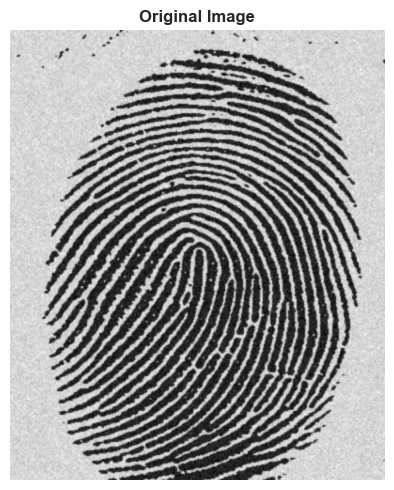

In [66]:
image = load_image('Fig1038(a)(noisy_fingerprint).tif', grayscale=True)
show_images([image], ['Original Image'])

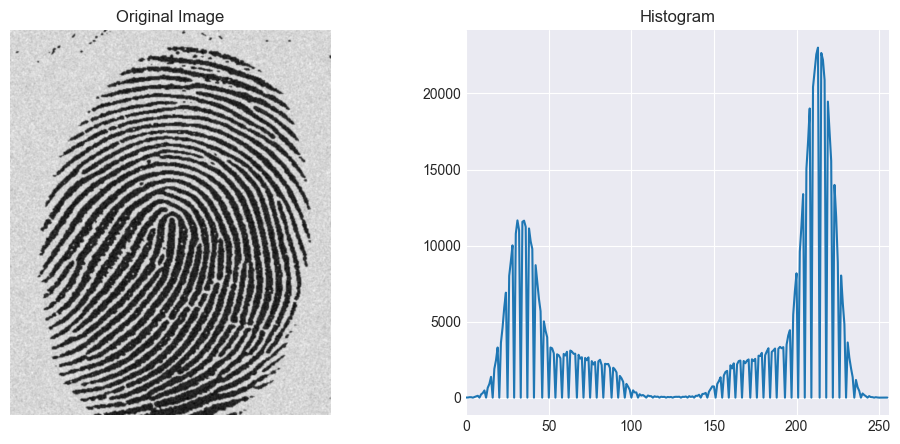

In [67]:
hist,bins=np.histogram(image,256)

plt.figure(figsize=(12, 5))

# Image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Histogram
plt.subplot(1, 2, 2)
plt.plot(hist)
plt.title('Histogram')
plt.xlim([0, 256])

plt.show()

a. Manual

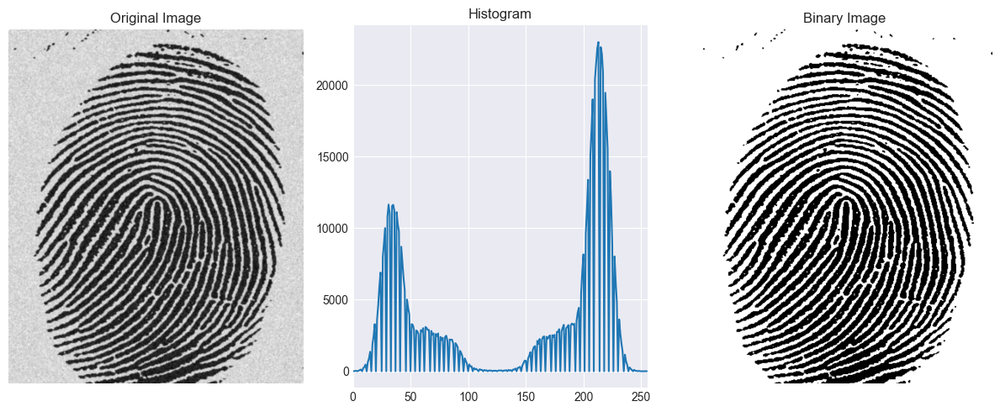

In [68]:

threshold_value= 100
_, binary = cv2.threshold(image, threshold_value, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(12, 5))

# Image
plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Histogram
plt.subplot(1, 3, 2)
plt.plot(hist)
plt.title('Histogram')
plt.xlim([0, 256])

# Image
plt.subplot(1, 3, 3)
plt.imshow(binary, cmap='gray')
plt.title('Binary Image')
plt.axis('off')
plt.tight_layout()
plt.show()


b. otsu Method

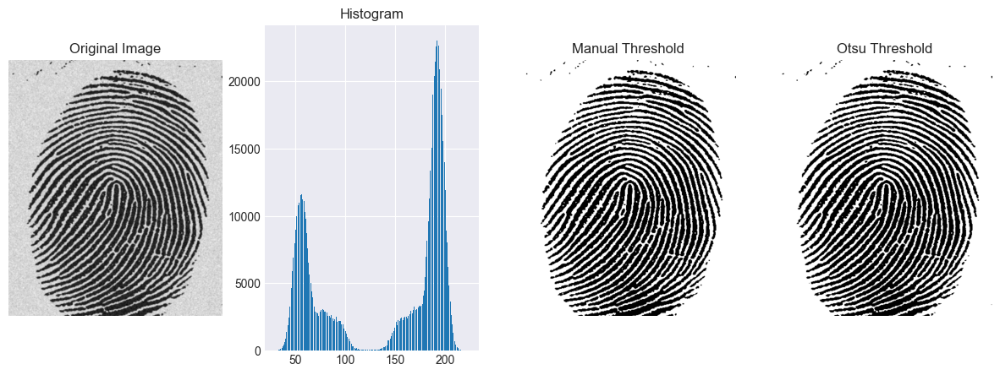

In [69]:
thresh_val, binary2= cv2.threshold(image,0,255,cv2.THRESH_OTSU)

# Plot image, hist, manual thresh and otsu thres
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

# Histogram
plt.subplot(1, 4, 2)
plt.hist(image.ravel(), bins=256)
plt.title("Histogram")

# Manual Threshold
plt.subplot(1, 4, 3)
plt.imshow(binary, cmap='gray')
plt.title("Manual Threshold")
plt.axis('off')

# Otsu Threshold
plt.subplot(1, 4, 4)
plt.imshow(binary2, cmap='gray')
plt.title("Otsu Threshold")
plt.axis('off')

plt.show()



### Using image smoothing to imporve global thresholding

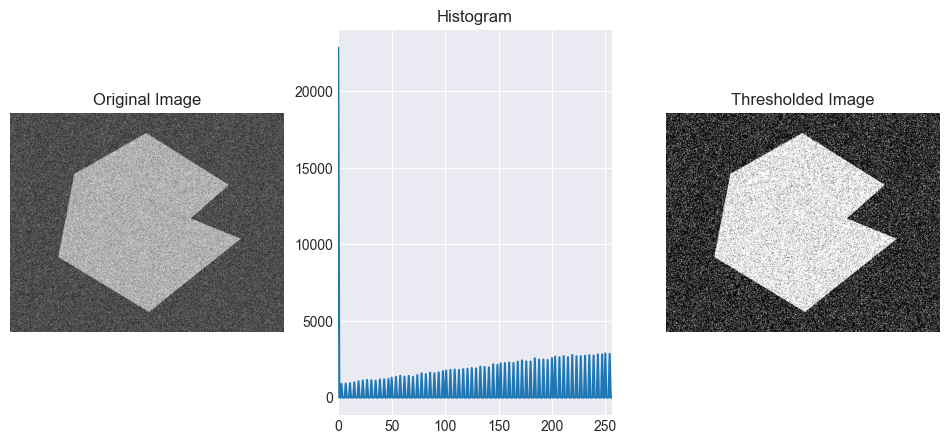

In [71]:
image = cv2.imread('Fig1040(a)(large_septagon_gaussian_noise_mean_0_std_50_added).tif', cv2.IMREAD_GRAYSCALE)
hist,bins = np.histogram(image,1000)
_,threshed_img = cv2.threshold(image,0,255,cv2.THRESH_OTSU)

plt.figure(figsize=(12, 5))

# Image
plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Histogram
plt.subplot(1, 3, 2)
plt.plot(hist)
plt.title('Histogram')
plt.xlim([0, 256])

# Threshold Image
plt.subplot(1, 3, 3)
plt.imshow(threshed_img, cmap='gray')
plt.title('Thresholded Image')
plt.axis('off')

plt.show()

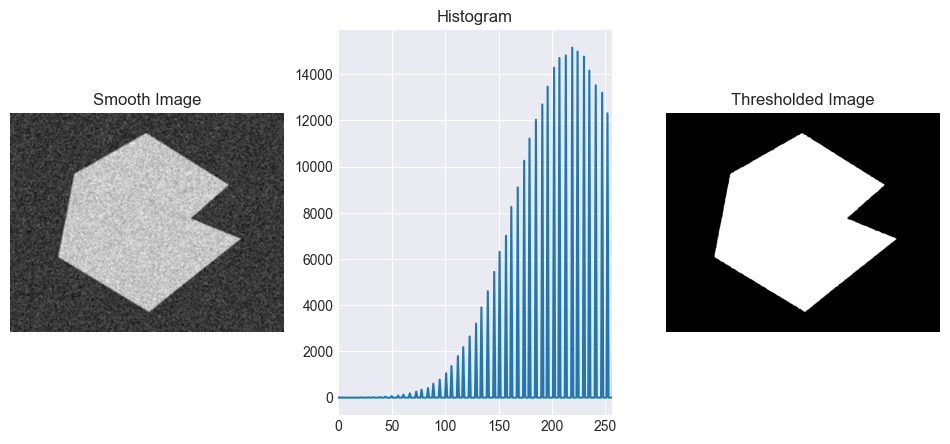

In [72]:

#averaging image
kernel = (np.ones((5,5)))/25
avg_img = cv2.filter2D(image,-1,kernel)

# Now calculate hist
hist,bins = np.histogram(avg_img,1000)

# Apply Threshold
_,threshed_img = cv2.threshold(avg_img,0,255,cv2.THRESH_OTSU)


plt.figure(figsize=(12, 5))

# Image
plt.subplot(1, 3, 1)
plt.imshow(avg_img, cmap='gray')
plt.title('Smooth Image')
plt.axis('off')

# Histogram
plt.subplot(1, 3, 2)
plt.plot(hist)
plt.title('Histogram')
plt.xlim([0, 256])

# Threshold Image
plt.subplot(1, 3, 3)
plt.imshow(threshed_img, cmap='gray')
plt.title('Thresholded Image')
plt.axis('off')

plt.show()

### 2.2 Adaptive Thresholding

Problem: Single threshold fails when lighting varies across the image
Solution: Calculate different thresholds for different regions

**Two Variants:**
1. Mean Adaptive: T_local = mean(N) - C
2. Gaussian Adaptive: T_local = gaussian_weighted_mean(N) - C

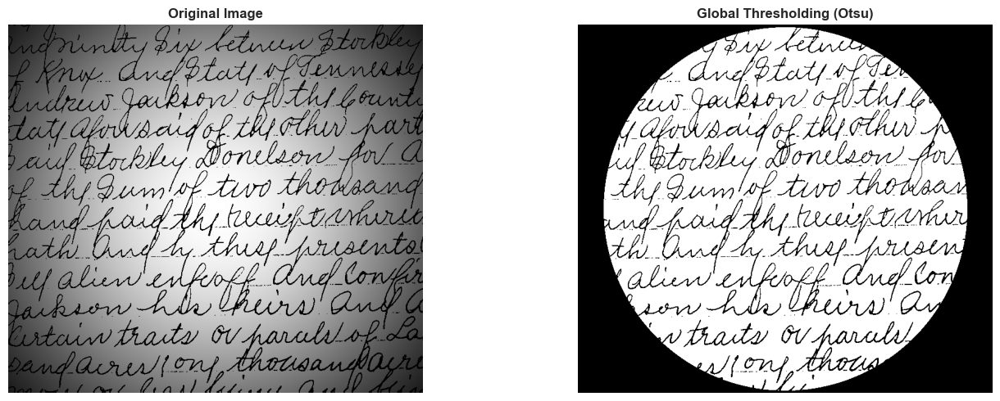

In [73]:
image = load_image('Fig1049(a)(spot_shaded_text_image).tif', grayscale=True)

# Apply Global for comaprison

_, binary1 = cv2.threshold(image,0,255,cv2.THRESH_OTSU)

show_images([image, binary1], ["Original Image", "Global Thresholding (Otsu)"])


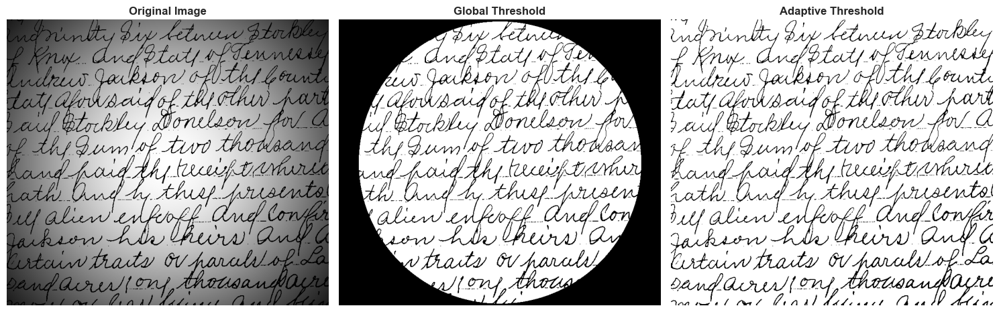

In [74]:
# Now apply adaptive threshold
C = 2
block_size=11

"""
- block_size: Neighborhood window size (must be odd)
- C: Constant subtracted from mean
"""

adaptive_method = cv2.ADAPTIVE_THRESH_GAUSSIAN_C
binary2 = cv2.adaptiveThreshold(image, 255, adaptive_method, 
                                   cv2.THRESH_BINARY, block_size, C)

# Show for comparison
show_images([image, binary1, binary2], ['Original Image', 'Global Threshold', 'Adaptive Threshold'])

### 2.3 Multi-Level Thresholding

Beyond binary: Segment images with multiple intensity levels

Formula:

$$ g(x,y) = 0\;  if\; f(x,y) < T₁ $$
$$ 1\;  if\; T₁ ≤ f(x,y) < T₂ $$
$$ 2\;  if\; T₂ ≤ f(x,y) < T₃ $$
$$ n\;  if\; f(x,y) ≥ Tₙ $$


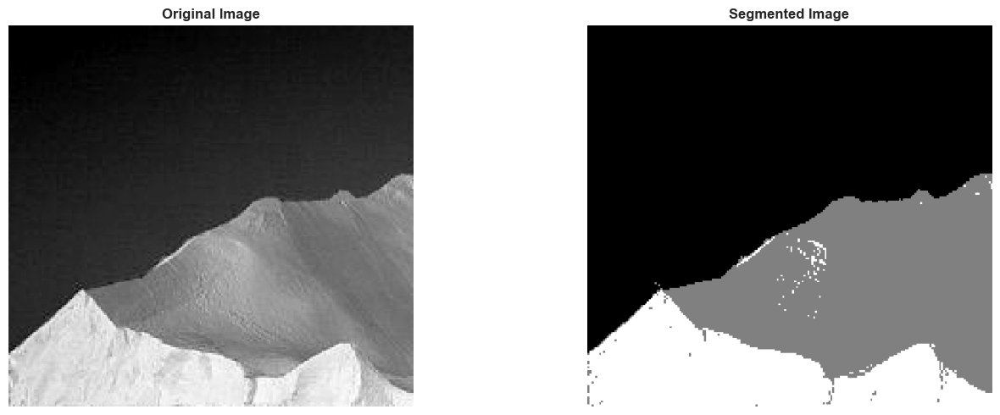

In [75]:
image = cv2.imread('Fig1045(a)(iceberg).tif', cv2.IMREAD_GRAYSCALE)
num_levels=3

# Reshape image
pixels = image.reshape(-1, 1)
    
# Apply K-Means
kmeans = KMeans(n_clusters=num_levels, random_state=42, n_init=10)
labels = kmeans.fit_predict(pixels)
    
# Reshape back
segmented = labels.reshape(image.shape)
    
# Sort centers and reassign labels
centers = kmeans.cluster_centers_.flatten()
sorted_indices = np.argsort(centers)
label_map = {old: new for new, old in enumerate(sorted_indices)}
segmented = np.array([label_map[label] for label in segmented.flatten()]).reshape(image.shape)

# Show result
show_images([image, segmented],['Original Image', 'Segmented Image'])

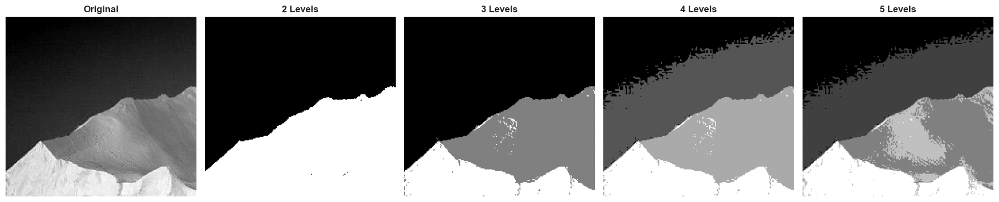

In [43]:
results = []
titles = ['Original']
results.append(image)
    
for n_levels in [2, 3, 4, 5]:
    # Reshape image
    pixels = image.reshape(-1, 1)
    
    # Apply K-Means
    kmeans = KMeans(n_clusters=n_levels, random_state=42, n_init=10)
    labels = kmeans.fit_predict(pixels)
    
    # Reshape back
    segmented = labels.reshape(image.shape)
    
    # Sort centers and reassign labels
    centers = kmeans.cluster_centers_.flatten()
    sorted_indices = np.argsort(centers)
    label_map = {old: new for new, old in enumerate(sorted_indices)}
    segmented = np.array([label_map[label] for label in segmented.flatten()]).reshape(image.shape)
    results.append(segmented)
    titles.append(f'{n_levels} Levels')
    
show_images(results, titles, figsize=(18, 4))

## 3. EDGE-BASED SEGMENTATION

### Core Assumption:
Object boundaries = Strong intensity gradients

### Process:
1. Detect edges using gradient operators
2. Link edge fragments into contours
3. Fill contours to create regions

### Gradient Operators:
- ∂f/∂x (horizontal changes)
- ∂f/∂y (vertical changes)
- Magnitude: $$ √((∂f/∂x)² + (∂f/∂y)²) $$
- Direction: $$ tan⁻¹(∂f/∂y / ∂f/∂x) $$

### 3.1 Gradient-Based Edge Detection

In [76]:
def compute_gradients(image):
    """Compute image gradients using Sobel operator"""
    # Sobel operators
    grad_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    
    # Magnitude and direction
    magnitude = np.sqrt(grad_x**2 + grad_y**2)
    direction = np.arctan2(grad_y, grad_x)
    
    return grad_x, grad_y, magnitude, direction

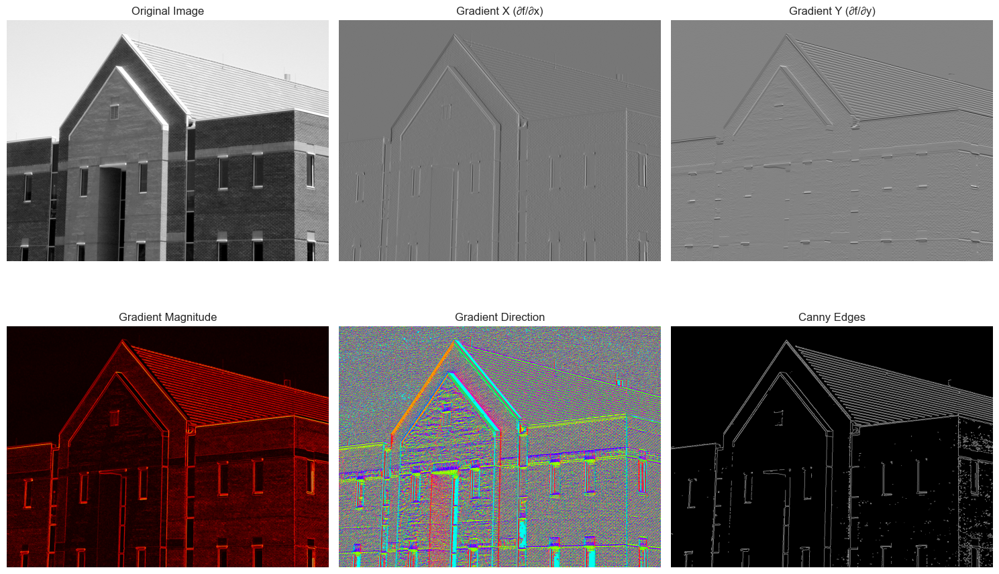

In [77]:
img = load_image("Fig1022(a)(building_original).tif", grayscale=True)
    
grad_x, grad_y, magnitude, direction = compute_gradients(img)
    
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
axes[0, 0].imshow(img, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')
    
axes[0, 1].imshow(grad_x, cmap='gray')
axes[0, 1].set_title('Gradient X (∂f/∂x)')
axes[0, 1].axis('off')
    
axes[0, 2].imshow(grad_y, cmap='gray')
axes[0, 2].set_title('Gradient Y (∂f/∂y)')
axes[0, 2].axis('off')
    
axes[1, 0].imshow(magnitude, cmap='hot')
axes[1, 0].set_title('Gradient Magnitude')
axes[1, 0].axis('off')
    
axes[1, 1].imshow(direction, cmap='hsv')
axes[1, 1].set_title('Gradient Direction')
axes[1, 1].axis('off')
    
# Edge detection
edges = cv2.Canny(img, 200, 255)
axes[1, 2].imshow(edges, cmap='gray')
axes[1, 2].set_title('Canny Edges')
axes[1, 2].axis('off')
    
plt.tight_layout()
plt.show()

### 3.2 Canny Edge Detection

**Why Canny is Special:**
Optimizes three criteria:
1. Good detection: Low error rate
2. Good localization: Edges close to true position
3. Single response: One detection per edge

**Steps:**
1. Gaussian smoothing (noise reduction)
2. Gradient computation (Sobel)
3. Non-maximum suppression (thin edges)
4. Double thresholding (strong/weak edges)
5. Edge tracking by hysteresis (connect edges)

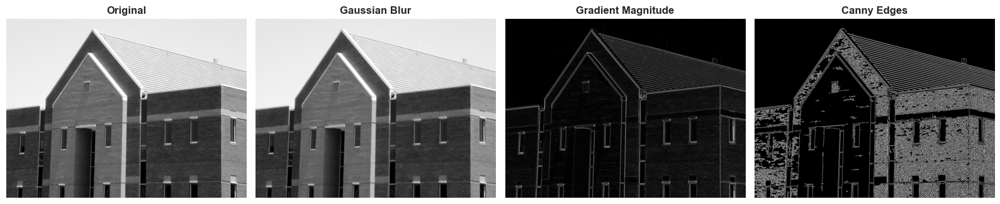

In [78]:
image = load_image("Fig1022(a)(building_original).tif", grayscale=True)

low_threshold=50
high_threshold=150
sigma=1.0

# Step 1: Gaussian smoothing
blurred = cv2.GaussianBlur(image, (5, 5), sigma)
    
# Step 2: Compute gradients
grad_x, grad_y, magnitude, direction = compute_gradients(blurred)
    
# Step 3-5: Use OpenCV's optimized implementation
edges = cv2.Canny(image, low_threshold, high_threshold)
    

show_images([image, blurred, magnitude, edges],
                   ['Original', 'Gaussian Blur', 'Gradient Magnitude', 'Canny Edges'],
                   figsize=(16, 4))

demo canny parameters specifically low and high threshold

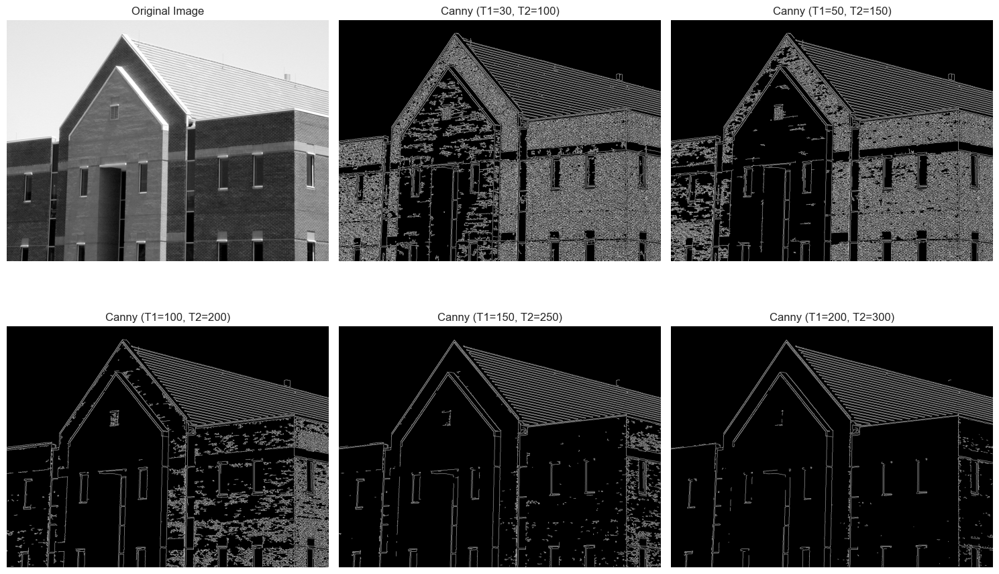

In [80]:
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
# Original
axes[0, 0].imshow(img, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')
    
# Different threshold combinations
params = [(30, 100), (50, 150), (100, 200), (150, 250), (200, 300)]
    
for idx, (low, high) in enumerate(params):
    row = (idx + 1) // 3
    col = (idx + 1) % 3
    edges = cv2.Canny(img, low, high)
    axes[row, col].imshow(edges, cmap='gray')
    axes[row, col].set_title(f'Canny (T1={low}, T2={high})')
    axes[row, col].axis('off')
    
plt.tight_layout()
plt.show()

### 3.3 Contour Extraction and Region Filling

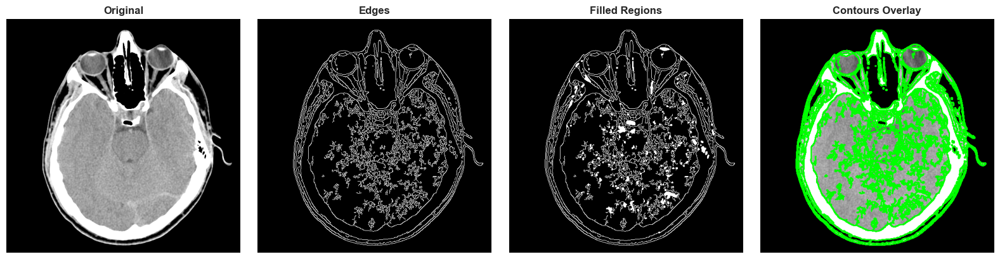

In [81]:
import scipy.ndimage as nd # pip install scipy
img = load_image('Fig1026(a)(headCT-Vandy).tif', grayscale=True)
    
# Detect edges
edges = cv2.Canny(img, 50, 150)
# Find contours
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, 
                                   cv2.CHAIN_APPROX_SIMPLE)   

filled = nd.binary_fill_holes(edges)


# Draw contours on original
img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
contour_img = img_color.copy()
cv2.drawContours(contour_img, contours, -1, (0, 255, 0), 2)
    
show_images([img, edges, filled, contour_img],
                ['Original', 'Edges', 'Filled Regions', 'Contours Overlay'],
                figsize=(16, 4))


### 4. REGION-BASED SEGMENTATION

### Philosophy:
Start from seed points and grow regions by adding similar neighbors

### Similarity Criteria:
1. Intensity: |I(x,y) - mean(R)| < T
2. Color: ||color(x,y) - mean_color(R)|| < T
3. Texture: texture_distance(x,y, R) < T

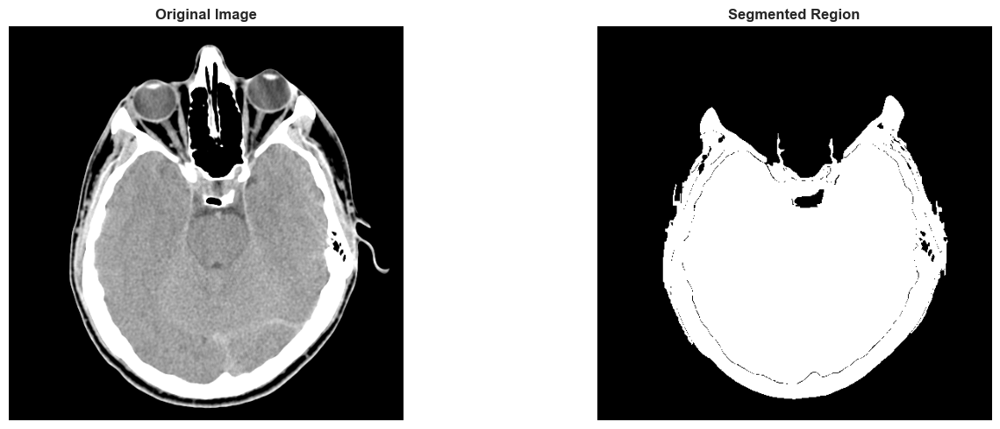

In [82]:
import cv2
import numpy as np

# Load image
img = load_image('Fig1026(a)(headCT-Vandy).tif', grayscale=True)
h, w = img.shape

# Seed point
seed = (w//4, h//2)

# Thresholds for floodFill (optional, can set to 0 if exact match not needed)
lo, up = 15, 15

# Prepare mask (must be 2 pixels larger than image)
mask = np.zeros((h + 2, w + 2), np.uint8)
flooded = img.copy()

# Flood fill
cv2.floodFill(flooded, mask, seed, 255, loDiff=lo, upDiff=up)

# Extract mask result
region_mask = (mask[1:-1, 1:-1] * 255).astype(np.uint8)

# Display
show_images([img, region_mask], ["Original Image", "Segmented Region"])


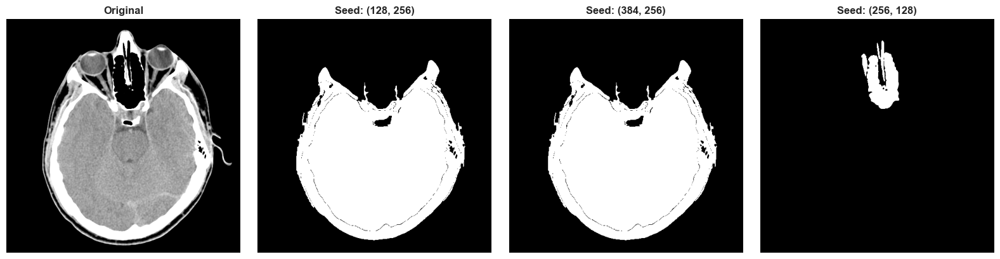

In [83]:
# Load image
img = load_image('Fig1026(a)(headCT-Vandy).tif', grayscale=True)
h, w = img.shape

# Seeds
seeds = [(w//4, h//2), (3*w//4, h//2), (w//2, h//4)]
lo, up = 15, 15   # similarity threshold

results = [img]
titles  = ["Original"]

for seed in seeds:

    # Make a copy to flood-fill on
    flooded = img.copy()

    # Mask must be 2 pixels larger
    mask = np.zeros((h + 2, w + 2), np.uint8)

    # Fill the region
    cv2.floodFill(
        flooded,                 # image to modify
        mask,                    # mask (required)
        seed,                    # seed point
        255,                     # value to paint the region
        loDiff=lo,               # allowed lower diff
        upDiff=up                # allowed upper diff
    )

    # Extract mask result (remove padding)
    region_mask = mask[1:-1, 1:-1].copy()

    # Convert mask {0,1} → {0,255}
    region_mask = (region_mask * 255).astype(np.uint8)

    results.append(region_mask)
    titles.append(f"Seed: {seed}")

# Display
show_images(results, titles, figsize=(16, 4))


### 4.2 Region Split and Merge
Combines top-down splitting with bottom-up merging using quadtree

**Phase 1: SPLITTING**
- Split non-homogeneous regions into 4 quadrants
- Recursively check sub-regions

**Phase 2: MERGING**
- Merge similar adjacent regions

### **_Note: This cell can take some time to execute._**
Reason: Using our own custom python file to practice this seg method.

Starting splitting phase...
Splitting complete. Created 3736 regions.
Starting merging phase...
Merging complete. Final regions: 405
Merging complete. Final regions: 405


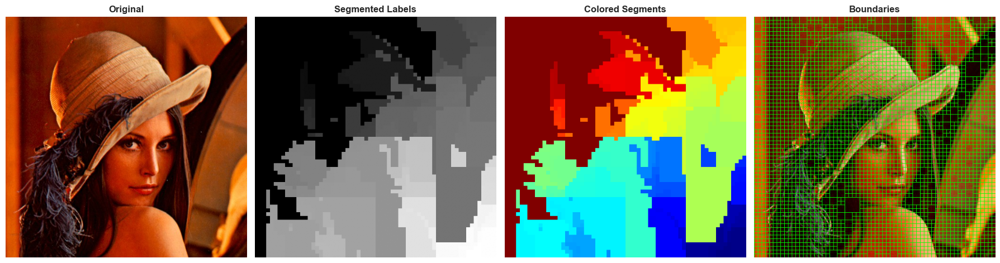

In [84]:


# Our custom python file for region split and merge segmentation
from region_split_merge import segment_image, segment_and_visualize, RegionSplitMerge

# Example using convenience function
img = load_image('Fig0638(a)(lenna_RGB).tif')

# Segment and get visualizations
segmented, colored, boundaries = segment_and_visualize(
    img,
    min_region_size=8,
    std_threshold=15,
    intensity_threshold=15,
    show_boundaries=True
)

# Display
show_images([img, segmented, colored, boundaries],
            ['Original', 'Segmented Labels', 'Colored Segments', 'Boundaries'],
            figsize=(18, 5))


### 5. CLUSTERING-BASED SEGMENTATION


### New Perspective:
Treat each pixel as a data point in feature space, then cluster

### 5.1 K-Means Segmentation



### K-Means Clustering

**Algorithm:**
1. Initialize K cluster centers
2. Assignment: Assign pixels to nearest center
3. Update: Recompute centers as mean of assigned pixels
4. Repeat until convergence

**Distance Metric:**
d(pixel, center) = √(Σ(fᵢ - cᵢ)²)


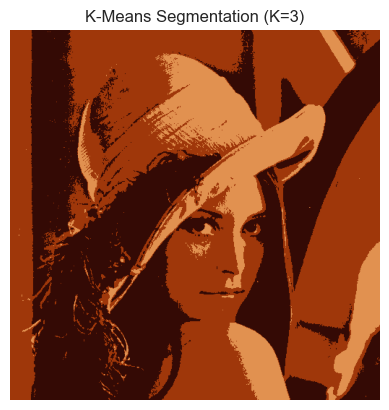

In [85]:
# Load Image
img = load_image('Fig0638(a)(lenna_RGB).tif', grayscale=False)

# 1. Prepare Data: Flatten to a list of pixels (float32 is required by cv2.kmeans)
pixel_values = img.reshape((-1, 3))
pixel_values = np.float32(pixel_values)

# 2. Define Criteria (Stop if epsilon < 0.2 OR after 100 iterations)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

# 3. Apply Built-in K-Means
k = 3  # Number of clusters
_, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# 4. Reconstruct Image
centers = np.uint8(centers) # Convert centers back to uint8
segmented_data = centers[labels.flatten()] # Map labels to center colors
segmented_image = segmented_data.reshape((img.shape))

# Display
plt.imshow(segmented_image)
plt.title(f'K-Means Segmentation (K={k})')
plt.axis('off')
plt.show()

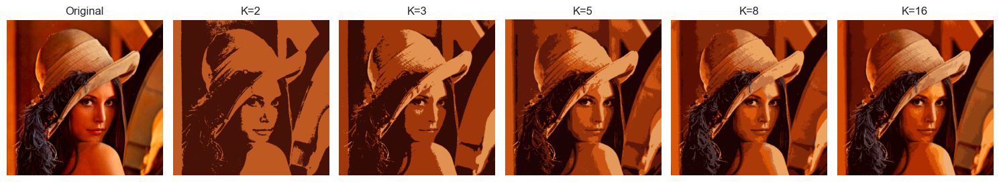

In [86]:

def run_kmeans_demo(image_path, k_values=[2, 3, 5, 8, 16]):
    # Load
    img = cv2.imread(image_path)
    if img is None: raise ValueError("Image not found")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Pre-calculate common data
    pixel_values = np.float32(img.reshape((-1, 3)))
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

    plt.figure(figsize=(15, 5))
    
    # Plot Original
    plt.subplot(1, len(k_values) + 1, 1)
    plt.imshow(img)
    plt.title("Original")
    plt.axis('off')

    # Loop through K values
    for i, k in enumerate(k_values):
        # Built-in K-means
        _, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
        
        # Reconstruct
        centers = np.uint8(centers)
        seg_img = centers[labels.flatten()].reshape(img.shape)
        
        # Plot
        plt.subplot(1, len(k_values) + 1, i + 2)
        plt.imshow(seg_img)
        plt.title(f'K={k}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Run the demo
run_kmeans_demo('Fig0638(a)(lenna_RGB).tif')

### 5.2 Mean-Shift Clustering

**Advantage:** Automatically finds number of clusters!

**Core Idea:**
Each data point "climbs" to nearest mode (peak) in density distribution

**Mean-Shift Vector:**
Direction: Current position → Mean of neighborhood

Mean-Shift found 42 clusters


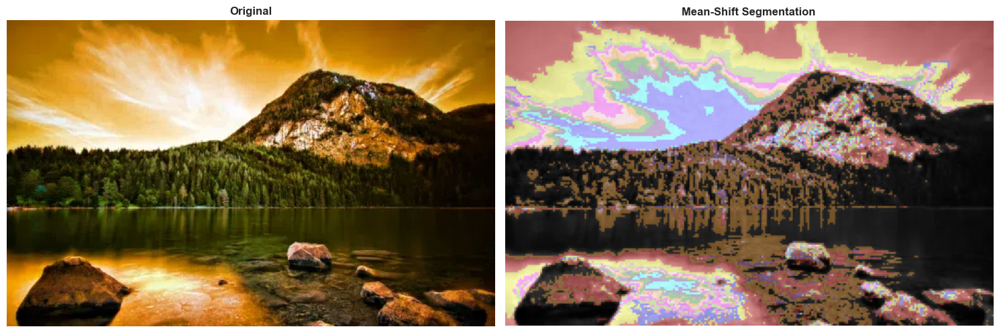

In [87]:

# Load and downsample image
img = load_image('image2.png')
img_small = cv2.resize(img, (img.shape[1]//2, img.shape[0]//2))

# Prepare features (flatten spatial + color)
features = img_small.reshape(-1, 3)  # For color images

# Apply Mean-Shift (built-in)
ms = MeanShift(bandwidth=15, bin_seeding=True)
labels = ms.fit_predict(features)

# Reshape labels to image
segmented = labels.reshape(img_small.shape[:2])
print(f"Mean-Shift found {len(np.unique(labels))} clusters")

# Colored visualization
colored = color.label2rgb(segmented, image=img_small, bg_label=0)

show_images([img, colored], titles=["Original", "Mean-Shift Segmentation"])

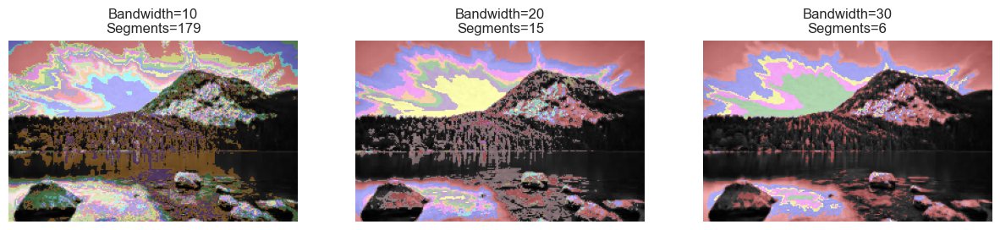

In [22]:
# Comparison demo with different bandwidths
bandwidths = [10, 20, 30]
plt.figure(figsize=(15,5))

for i, bw in enumerate(bandwidths):
    ms = MeanShift(bandwidth=bw, bin_seeding=True)
    labels = ms.fit_predict(img_small.reshape(-1, 3))
    segmented = labels.reshape(img_small.shape[:2])
    colored = color.label2rgb(segmented, image=img_small, bg_label=0)
    
    plt.subplot(1, len(bandwidths), i+1)
    plt.imshow(colored)
    plt.title(f"Bandwidth={bw}\nSegments={len(np.unique(labels))}")
    plt.axis('off')

plt.show()


## 6. GRAPH-BASED SEGMENTATION
### Representation:
- Image as weighted graph G = (V, E)
- Vertices: Pixels
- Edges: Connections between adjacent pixels
- Weights: Similarity/dissimilarity

### Objective:
Minimize $$ Cut(A,B) = Σw(i,j) for i∈A, j∈B $$

**Normalized Cut:**
$$ NCut(A,B) = Cut(A,B)/Vol(A) + Cut(A,B)/Vol(B) $$

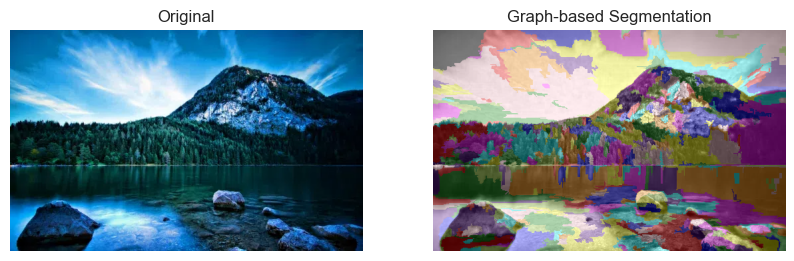

In [88]:
from skimage.segmentation import felzenszwalb
from skimage import color

# Load image
img = cv2.imread('image1.png')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Ensure 3 channels

# Apply Felzenszwalb graph-based segmentation
segments = felzenszwalb(img_rgb, scale=100, sigma=0.5, min_size=50)

# Colored visualization
colored = color.label2rgb(segments, image=img_rgb, bg_label=0)

# Display
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(img_rgb)
plt.title("Original")
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(colored)
plt.title("Graph-based Segmentation")
plt.axis('off')
plt.show()

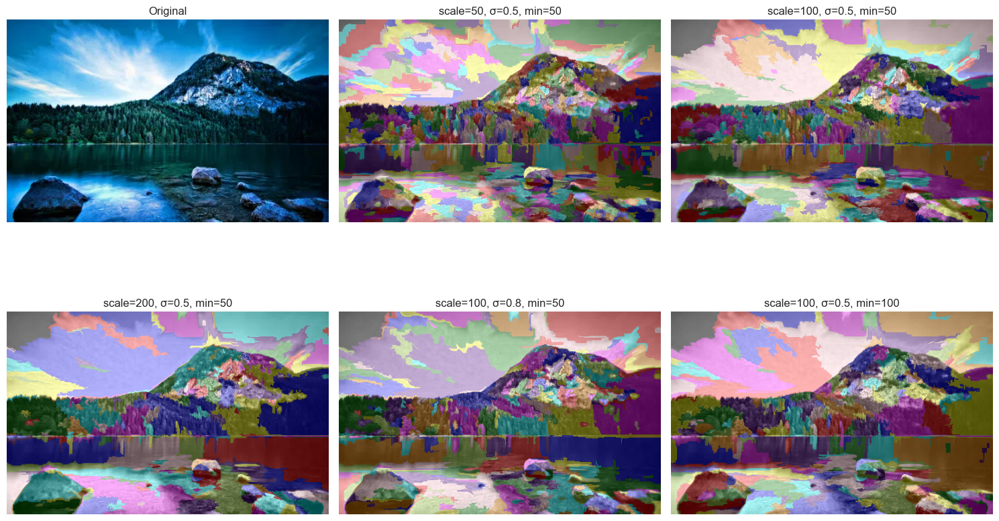

In [89]:
# Different parameter combinations to compare
params = [
    (50, 0.5, 50),
    (100, 0.5, 50),
    (200, 0.5, 50),
    (100, 0.8, 50),
    (100, 0.5, 100)
]

fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes[0,0].imshow(img_rgb)
axes[0,0].set_title("Original")
axes[0,0].axis('off')

for idx, (scale, sigma, min_size) in enumerate(params):
    row = (idx + 1) // 3
    col = (idx + 1) % 3
    
    segments = felzenszwalb(img_rgb, scale=scale, sigma=sigma, min_size=min_size)
    colored = color.label2rgb(segments, image=img_rgb, bg_label=0)
    
    axes[row, col].imshow(colored)
    axes[row, col].set_title(f"scale={scale}, σ={sigma}, min={min_size}")
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()


# Advance Classical Methods

## Watershed Algorithm (Separating Objects)

Concept: Treats the image as a topographic map to separate touching objects . Best For: Cell counting, separating coins/seeds.

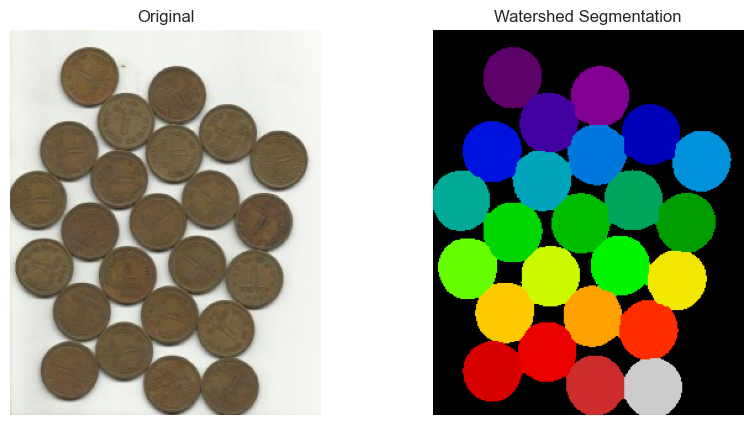

In [90]:
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
from scipy import ndimage

# Load image
img = cv2.imread('water_coins.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 1. Binarize using Otsu
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

# 2. Distance Transform
distance = ndimage.distance_transform_edt(thresh)

# 3. Find Peaks (object centers)
coords = peak_local_max(distance, min_distance=20, labels=thresh)
mask = np.zeros(distance.shape, dtype=bool)
mask[tuple(coords.T)] = True
markers, _ = ndimage.label(mask)

# 4. Apply Watershed
labels = watershed(-distance, markers, mask=thresh)

# Visualize
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(img_rgb)
plt.title("Original")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(labels, cmap='nipy_spectral')
plt.title("Watershed Segmentation")
plt.axis('off')
plt.show()


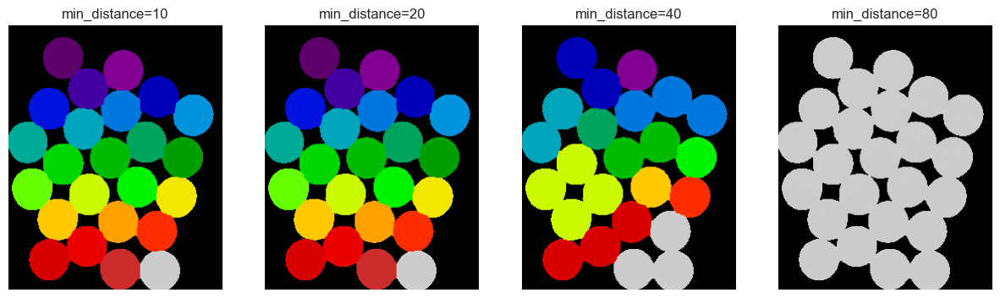

In [91]:
# Try different min_distance values to see effect on segmentation
min_distances = [10,20, 40, 80]

plt.figure(figsize=(15,5))

for i, md in enumerate(min_distances):
    coords = peak_local_max(distance, min_distance=md, labels=thresh)
    mask = np.zeros(distance.shape, dtype=bool)
    mask[tuple(coords.T)] = True
    markers, _ = ndimage.label(mask)
    labels = watershed(-distance, markers, mask=thresh)
    
    plt.subplot(1, len(min_distances), i+1)
    plt.imshow(labels, cmap='nipy_spectral')
    plt.title(f"min_distance={md}")
    plt.axis('off')

plt.show()

### Active Contours (Snakes)

Concept: A curve that evolves to fit the object boundary by minimizing energy (smoothness + matching edges) . Best For: Medical imaging, fitting smooth shapes.

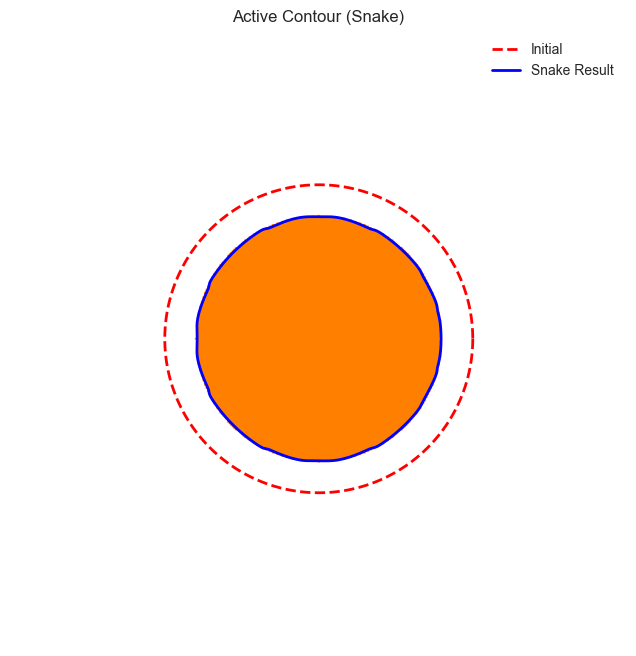

In [92]:
from skimage.filters import gaussian
from skimage.segmentation import active_contour


# Load image
img = cv2.imread('snake_example_color.png')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Initialize a circle around the object (manual initialization)
s = np.linspace(0, 2*np.pi, 400)
center_x, center_y = 200, 200  # match the circle position
radius = 100                   # slightly larger than the actual circle
x = center_x + radius * np.cos(s)
y = center_y + radius * np.sin(s)
init = np.array([x, y]).T

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Smooth image with Gaussian for gradient calculation
smoothed = gaussian(gray, sigma=3)

# Run active contour (Snake)
snake = active_contour(smoothed, init, alpha=0.015, beta=10, gamma=0.001)

# Visualize
plt.figure(figsize=(8,8))
plt.imshow(img_rgb)
plt.plot(init[:,0], init[:,1], '--r', lw=2, label='Initial')
plt.plot(snake[:,0], snake[:,1], '-b', lw=2, label='Snake Result')
plt.legend()
plt.axis('off')
plt.title('Active Contour (Snake)')
plt.show()


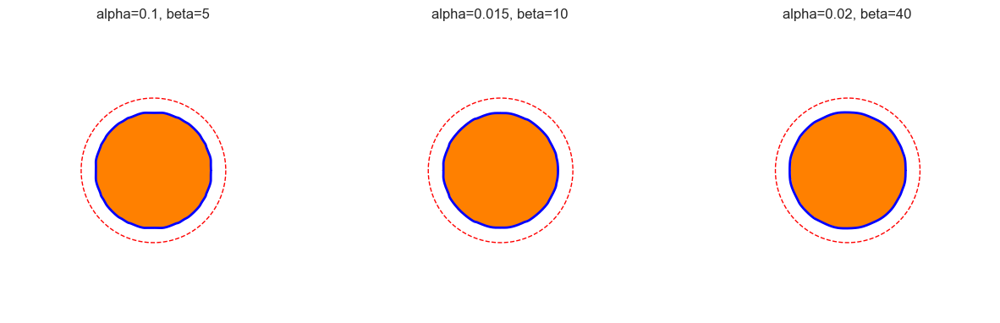

In [93]:
# Compare snakes with different alpha/beta parameters
params = [
    (0.1, 5),
    (0.015, 10),
    (0.02, 40)
]

plt.figure(figsize=(15,5))

for i, (alpha, beta) in enumerate(params):
    snake = active_contour(smoothed, init, alpha=alpha, beta=beta, gamma=0.001)
    
    plt.subplot(1, len(params), i+1)
    plt.imshow(img_rgb)
    plt.plot(init[:,0], init[:,1], '--r', lw=1)
    plt.plot(snake[:,0], snake[:,1], '-b', lw=2)
    plt.title(f"alpha={alpha}, beta={beta}")
    plt.axis('off')

plt.show()


## GrabCut (Interactive Extraction)
Concept: Iterative Graph Cut using a bounding box. Models Foreground/Background color distributions . Best For: Extracting specific objects with a simple box input.

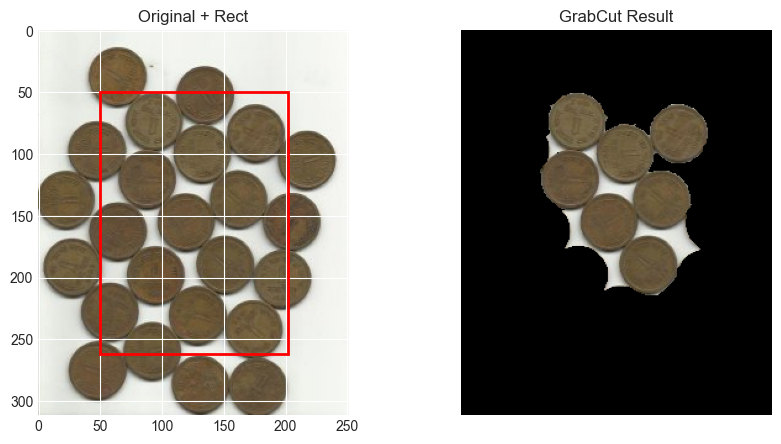

In [96]:

# Load image
img = cv2.imread('water_coins.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Define rectangle around foreground (x, y, w, h)
rect = (50, 50, img.shape[1]-100, img.shape[0]-100)

# Initialize mask and models
mask = np.zeros(img.shape[:2], np.uint8)
bgd_model = np.zeros((1, 65), np.float64)
fgd_model = np.zeros((1, 65), np.float64)

# Run GrabCut
cv2.grabCut(img, mask, rect, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_RECT)

# Convert mask to binary: 0=background, 1=foreground
mask2 = np.where((mask==2)|(mask==0), 0, 1).astype('uint8')
result = img * mask2[:, :, np.newaxis]

# Visualize
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(img_rgb)
plt.title('Original + Rect')
plt.gca().add_patch(plt.Rectangle((rect[0], rect[1]), rect[2], rect[3],
                                  edgecolor='r', facecolor='none', lw=2))

plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title('GrabCut Result')
plt.axis('off')
plt.show()


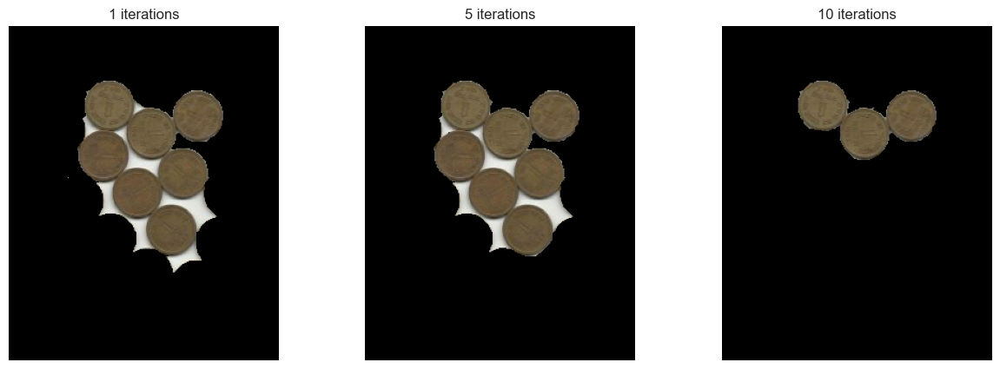

In [97]:
# Compare different numbers of GrabCut iterations
iterations_list = [1, 5, 10]

plt.figure(figsize=(15,5))
for i, iters in enumerate(iterations_list):
    mask = np.zeros(img.shape[:2], np.uint8)
    bgd_model = np.zeros((1,65), np.float64)
    fgd_model = np.zeros((1,65), np.float64)
    
    cv2.grabCut(img, mask, rect, bgd_model, fgd_model, iters, cv2.GC_INIT_WITH_RECT)
    mask2 = np.where((mask==2)|(mask==0), 0, 1).astype('uint8')
    result = img * mask2[:,:,np.newaxis]
    
    plt.subplot(1, len(iterations_list), i+1)
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.title(f"{iters} iterations")
    plt.axis('off')

plt.show()


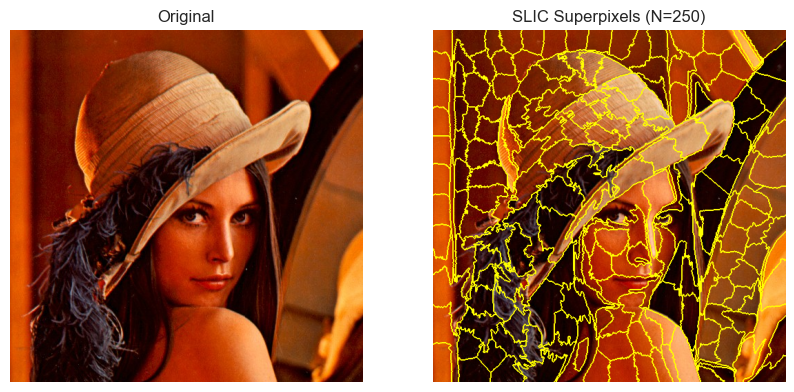

In [98]:
import cv2
import matplotlib.pyplot as plt
from skimage.segmentation import slic, mark_boundaries

# Load image
img = cv2.imread('Fig0638(a)(lenna_RGB).tif')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Run SLIC superpixels
n_segments = 250
segments = slic(img_rgb, n_segments=n_segments, compactness=10, start_label=1)

# Visualize boundaries
vis = mark_boundaries(img_rgb, segments)

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(img_rgb)
plt.title('Original')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(vis)
plt.title(f'SLIC Superpixels (N={n_segments})')
plt.axis('off')
plt.show()


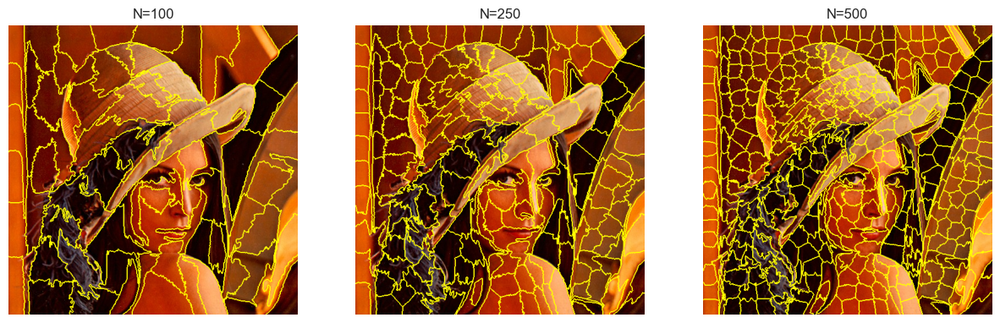

In [99]:
# Compare SLIC with different numbers of superpixels
n_list = [100, 250, 500]

plt.figure(figsize=(15,5))
for i, n in enumerate(n_list):
    segments = slic(img_rgb, n_segments=n, compactness=10, start_label=1)
    vis = mark_boundaries(img_rgb, segments)
    
    plt.subplot(1, len(n_list), i+1)
    plt.imshow(vis)
    plt.title(f'N={n}')
    plt.axis('off')
plt.show()
